<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ вакансий на hh.ru
   

In [313]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objects as go

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [314]:
hh_data=pd.read_csv('data/dst-3.0_16_1_hh_database.csv',sep=';')

2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [315]:
display(hh_data.head())

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

4. Обратите внимание на информацию о числе непустых значений.

In [316]:
hh_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

5. Выведите основную статистическую информацию о столбцах.


In [317]:
hh_data.describe()

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [318]:
#Создаем функцию edu_change() для преобразования признака "Образование и ВУЗ"
def edu_change(education):
    edu=education.split(' образование')
    return edu[0].lower()

#создадим копию во избежание повреждения первоначальный DataFrame
hh_copy=hh_data.copy()

#создадим новый признак "Образование"
hh_copy['Образование']=hh_copy['Образование и ВУЗ'].apply(edu_change) 

#удалим признак "Образование и ВУЗ"
hh_copy.drop(['Образование и ВУЗ'], axis=1, inplace=True) 

hh_copy['Образование'].unique()

array(['неоконченное высшее', 'высшее', 'среднее специальное', 'среднее'],
      dtype=object)

2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [319]:
#Создадим функции gender() и age() для преобразования признака "Пол, возраст"
def gender(genage):
    gen=genage.split(' , ')
    return 'М' if gen[0]=='Мужчина' else 'Ж'

def age(genage):
    age_split=genage.split(' , ')
    aged=int(age_split[1][:3])
    return aged

#Создаем новые признаки "Пол" и "Возраст"
hh_copy['Пол']=hh_copy['Пол, возраст'].apply(gender)
hh_copy['Возраст']=hh_copy['Пол, возраст'].apply(age)

#Удаляем признак "Пол, возраст"
hh_copy.drop(['Пол, возраст'], axis=1, inplace=True)

hh_copy['Возраст'].unique()

array([39, 60, 36, 38, 26, 29, 46, 34, 35, 59, 27, 21, 31, 37, 30, 33, 42,
       32, 23, 28, 25, 24, 43, 53, 49, 44, 48, 54, 22, 20, 40, 62, 72, 45,
       41, 61, 50, 58, 57, 52, 56, 18, 19, 51, 16, 47, 71, 63, 55, 64, 68,
       17, 73, 66, 65, 77, 67, 69, 76, 70, 14, 15, 10], dtype=int64)

3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [320]:
#Создаем функцию exp_change() для преобразования признака "Опыт работы"
def exp_change(experience):
    if experience is np.nan or experience == 'Не указано':
        return np.nan
    exp_split=experience.split(' ')[:7]
    m_words=['месяц', 'месяцев', 'месяца']
    y_words=['год', 'года', 'лет']
    months = 0
    years = 0
    for index, item in enumerate (exp_split):
        if item in y_words:
            years = int(exp_split[index-1])
        if item in m_words:
            months = int(exp_split[index-1])
    return int(years*12 + months)

#Создаем новый признак "Опыт работы (месяц)"
hh_copy['Опыт работы (месяц)']=hh_copy['Опыт работы'].apply(exp_change)
hh_copy['Опыт работы (месяц)'].median()

#Удаляем признак "Опыт работы"
hh_copy.drop(['Опыт работы'], axis=1, inplace=True)

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [321]:
#Создадим функции city_change(), ready_move() и ready_trip() для преобразования признака "Город, переезд, командировки"

def city_change(column):
    col_split=column.split(' ')[:1]
    million_cities = ['Новосибирск', 'Екатеринбург', 'Нижний Новгород', 'Казань', 'Челябинск', 'Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж', 'Волгоград' ]
    if col_split[0]=='Москва' or col_split[0]=='Санкт-Петербург':
        return col_split[0]
    elif col_split[0] in million_cities:
        return 'город-миллионник'
    else:
        return 'другие'
    
  
    
def ready_move(arg):
    if ('не готов к переезду' in arg) or ('не готова к переезду' in arg):
        return False
    elif 'хочу' in arg:
        return True
    else:
        return True
def ready_trip(arg):
    if ('командировка' in arg):
        if ('не готов к командировкам' in arg) or('не готова к командировкам' in arg):
            return False
        else:
            return True
    else:
        return False

#Создаем новые признаки

#Признак "Город"
hh_copy['Город']=hh_copy['Город, переезд, командировки'].apply(city_change)

#Признак "Готовность к переезду"
hh_copy['Готовность к переезду']=hh_copy['Город, переезд, командировки'].apply(ready_move)

#Признак "Готовность к командировкам"
hh_copy['Готовность к командировкам']=hh_copy['Город, переезд, командировки'].apply(ready_trip)

#Удаляем признак 'Город, переезд, командировки'
hh_copy.drop(['Город, переезд, командировки'], axis=1, inplace=True)

5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [322]:
#Создаем новые признаки на основании изменения признака "Занятость" с использованием лямбда-функции:
hh_copy['полная занятость']=hh_copy['Занятость'].apply(lambda x:True if 'полная занятость' in x else False)
hh_copy['частичная занятость']=hh_copy['Занятость'].apply(lambda x:True if 'частичная занятость' in x else False)
hh_copy['проектная работа']=hh_copy['Занятость'].apply(lambda x:True if 'проектная работа' in x else False)
hh_copy['стажировка']=hh_copy['Занятость'].apply(lambda x:True if 'стажировка' in x else False)
hh_copy['волонтерство']=hh_copy['Занятость'].apply(lambda x:True if 'волонтерство' in x else False)

#Создаем новые признаки на основании изменения признака "График" с использованием лямбда-функции:
hh_copy['полный день']=hh_copy['График'].apply(lambda x:True if 'полный день' in x else False)
hh_copy['сменный график']=hh_copy['График'].apply(lambda x:True if 'сменный график' in x else False)
hh_copy['гибкий график']=hh_copy['График'].apply(lambda x:True if 'гибкий график' in x else False)
hh_copy['удаленная работа']=hh_copy['График'].apply(lambda x:True if 'удаленная работа' in x else False)
hh_copy['вахтовый метод']=hh_copy['График'].apply(lambda x:True if 'вахтовый метод' in x else False)

#Удаляем признаки "Занятость" и "График"
hh_copy.drop(['Занятость', 'График'], axis=1, inplace=True)

6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [323]:
#Выгружаем данные по курсам валют и приводим в сопоставимый вид: 
# удаляем ненужные столбцы, приводим столбец date к формату datetime
rates=pd.read_csv('data/ExchangeRates.csv')
rates.drop(['per', 'time', 'vol'], axis=1, inplace=True)
rates['date']=pd.to_datetime(rates['date'],dayfirst=True).dt.date

#Создаем функции для создания признаков 'Сумма' и 'Валюта':
def add_salary(column):
    sal_split=int(column.split(' ')[0])
    return sal_split

def add_curr(column):
    curr_dict={'грн':'UAH','USD':'USD','EUR':'EUR', 'белруб':'BYN', 'KGS':'KGS','сум':'UZS','AZN':'AZN','KZT':'KZT'}
    curr_split=column.split(' ')[1]
    if '.' in curr_split:
        curr_split=curr_split.replace('.','')
    if curr_split in curr_dict:
        return curr_dict[curr_split]
    else:
        return curr_split

# Создаем dataframe из исходного для проведения расчетов
hh_sal=hh_copy[['ЗП', 'Обновление резюме']].copy()  #копируем необходимые столбцы
hh_sal['Сумма']=hh_sal['ЗП'].apply(add_salary)   #создаем признак 'Сумма'
hh_sal['Валюта']=hh_sal['ЗП'].apply(add_curr)    #создаем признак 'Валюта'
hh_sal['Дата']=pd.to_datetime(hh_sal['Обновление резюме'],dayfirst=True).dt.date   #создаем признак 'Дата'
hh_sal.drop(['ЗП', 'Обновление резюме'], axis=1, inplace=True) #Удаляем ненужные столбцы


#Объединяем dataframe для расчетов
hh_merge=hh_sal.merge(
    rates,
    left_on=['Валюта', 'Дата'],
    right_on=['currency', 'date'],
    how='left'
    )

#Заполняем признаки 'close' и 'proportion' со значением NaN значением 1 (для сумм, выраженных в рублях)
hh_merge['close']=hh_merge['close'].fillna(1)
hh_merge['proportion']=hh_merge['proportion'].fillna(1)

# В столбец "ЗП (руб)" заносим обновленную информацию о сумме ЗП, выраженной в рублях:
hh_copy['ЗП (руб)']=(hh_merge['Сумма']*hh_merge['close'])/hh_merge['proportion']
hh_copy['Обновление резюме']=pd.to_datetime(hh_copy['Обновление резюме'],dayfirst=True).dt.date

#Удаляем столбец "ЗП"
hh_copy.drop(['ЗП'], axis=1, inplace=True)


# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [324]:
fig = px.histogram(
    data_frame=hh_copy,
    x='Возраст',
    title='Распределение возраста соискателей',
    histnorm='percent',
    height=500,
    width=1000,
    marginal='box',
)
fig.show()
fig.write_html("plotly/age.html")

Мода распределения соискателей по возрасту 30 лет. Самому старшему соискателю 100 лет(это может быть ошибкой в данных) и самый младший возраст - 14 лет. Возраст большинства соискателей находится в интервале от 27 до 36 лет. Есть выброс в данных -100 лет. Это может быть ошибко ввода или преднамеренное искажение данных.Так же к выбросам можно отнести значения более 50 лет

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [325]:
fig = px.histogram(
    data_frame=hh_copy,
    x='Опыт работы (месяц)',
    title='Распределение опыта работы соискателей',
    histnorm='percent',
    height=500,
    width=1000,
    marginal='box',
)
fig.show()
fig.write_html("plotly/exp.html")

Мода распределения опыта работы равна 81 месяц или 6 лет и 9 месяцев. Большинство соискателей имеют опыт работы от 57 месяцев(4 года и 9 месяцев) до 154 месяцев (12 лет и 10 месяцев). Минимальное значение равно 1 месяц. Максимальный опыта работы равен 1188 месяцев (это 99 лет). Здель наблюдается выброс данных (это может быть ошибкой оператора или преднамеренное искажение данных). Так же к выбросам данных можно отнести значения больше 300 месяцев (это больше 25 лет).

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака ЗП? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [327]:
fig = px.histogram(
    data_frame=hh_copy,
    x='ЗП (руб)',
    title='Распределение желаемой ЗП соискателей',
    histnorm='percent',
    height=500,
    width=1000,
    marginal='box',
    log_y=True
)
fig.show()
fig.write_html("plotly/sal.html")

Максимальное значение заработной платы 24 миллиона 304 тысячи 876 руб., а минимальное 1 рубль. Большинство соискателей ищут ратоту с заработной платой примерно от 35 тыс.рублей до 95 тыс.рублей. Максимальное и минимальное значение можно назвать аномальными для заработной платы. Так же гигантскими значениями можно назвать заработную плату в 1750000 руб, 2500000 руб, 3000000 руб, 7675224 руб.

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

In [328]:
bar_edu = hh_copy.groupby(
    by='Образование',
    as_index=False
)[['ЗП (руб)']].median()

#строим график
fig = px.bar(
    data_frame=bar_edu, #датафрейм
    x="Образование", #ось x
    y="ЗП (руб)", #ось y
    color='Образование',
    text = 'ЗП (руб)', 
    orientation='v', 
    height=500, #высота
    width=1000, #ширина
    title='Зависимость медианной ЗП (руб) от уровня образовния' #заголовок
)

fig.layout.xaxis.title = "Уровень образования"
fig.layout.yaxis.title = "Желаемая заработная плата"
#отображаем его
fig.show()
fig.write_html("plotly/sal_edu.html")

Наибольший медианный уровень заработной платы в 60 тысяч руб. наблюдается у соискателей с высшим образованием. Наименьший медианный уровень ЗП 40 тыс. руб. у претендентов со средним и средним специальным образованием. Признак образования важен для рассматривания общей массы соискателей без учета специфики работы.

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

In [329]:
fig = px.box(
    data_frame=hh_copy[hh_copy['ЗП (руб)']<1000000],
    x='ЗП (руб)',
    y='Город',
    orientation='h',
    color='Город',
    height=500,
    width=1000,
    title='Распределение уровня желаемой ЗП (руб) в рублях'
)

fig.layout.xaxis.title=('Уровень ЗП (руб) в рублях');
fig.layout.yaxis.title=('Город');

#отображаем его
fig.show()
fig.write_html("plotly/sal_city.html")

Наибольшая медианная ЗП, а также наибольший размах по границам Тьюки уровня желаемой ЗП в Москве. Наименьшие значения медианной ЗП и размаха - для городов-миллионников и "других" городов.

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

In [330]:
bar_move=hh_copy.groupby(['Готовность к переезду', 'Готовность к командировкам'], as_index=False)['ЗП (руб)'].median()

fig=px.bar(
    data_frame=bar_move,
    x='Готовность к командировкам',
    y="ЗП (руб)",
    text = 'ЗП (руб)',
    color='Готовность к переезду',
    barmode='group',
    orientation='v', 
    height=500, #высота
    width=700, #ширина
    title='Зависимость медианной ЗП (руб) от готовности к переезду/командировкам'
)

fig.layout.xaxis.title=('Готовность к переезду/командировкам');
fig.layout.yaxis.title=('Уровень ЗП (руб)');

#отображаем его
fig.show()
fig.write_html("plotly/sal_move.html")

Прослеживается четкая зависимость увеличения уровня ожидаемой ЗП от готовности соискателей, как к переезду так и к командировкам.

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

In [331]:
pivot_data=pd.DataFrame(hh_copy.groupby(['Возраст', 'Образование'])['ЗП (руб)'].median())

pivot=pivot_data.pivot_table(
    values='ЗП (руб)',
    index='Образование',
    columns='Возраст'
)

fig=px.imshow(pivot, height=500, title='Зависимость медианной желаемой заработной платы от возраста и образования')
fig.show()
fig.write_html("plotly/sal_age_edu.html")

На тепловой карте видно, что быстрее растет медианная з/п у претендентов с высшим образованием в возрасте от 35 до 42 лет, затем растет от 55 до 60 лет и от 65 до 70 лет. У претендентов с неоконченным высшим образованием, наибольшая желаемая з/п в возрасте 40-45 лет и максимальная в возрасте примерно 57 лет. У претендентов со средним образованием не наблюдается закономерности в з/п от возраста. У соискателей со средним специальным образованием желаемая з/п примерно на одном уровне до 60 летнего возраста, затем з/п уменьшается и максимальная в возрасте 67 лет.

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

''

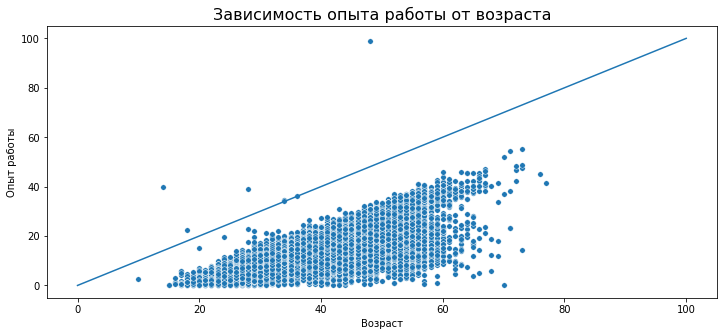

In [ ]:
scat_data=(hh_copy[['Опыт работы (месяц)', 'Возраст']]).copy()
scat_data['Опыт работы']=scat_data['Опыт работы (месяц)']/12

fig = plt.figure(figsize=(12, 5))
sns.lineplot(x=[0, 100], y=[0, 100])

scatterplot = sns.scatterplot(
    data=scat_data,
    x='Возраст',
    y='Опыт работы',
    s=30,
)
scatterplot.set_title('Зависимость опыта работы от возраста', fontsize=16)
scatterplot.set_xlabel('Возраст')
scatterplot.set_ylabel('Опыт работы')
;

In [ ]:
scat_data_filter = scat_data[scat_data['Опыт работы']>=scat_data['Возраст']]
fig = go.Figure(go.Scatter(x=scat_data_filter['Возраст'], y=scat_data_filter['Опыт работы'], mode='markers'))
fig.update_xaxes(title_text='Возраст')
fig.update_yaxes(title_text='Опыт работы')

Видим 7 явных аномалий, когда опыт работы больше возраста. Также явный выброс - это столетний соискатель без опыта работы.

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


**Зависимость медианной заработной платы от города и пола соискателя**

Построим гистограмму зависимости медианной заработной платы от города и пола соискателя. Данная зависимость покажет нам влияет ли место проживания соискателя и город на увеличение/снижение уровня желаемой заработной платы.

In [332]:
move_data = hh_copy.groupby(['Город','Пол'],as_index=False)['ЗП (руб)'].median()

fig = px.bar(
    data_frame=move_data,
    y='ЗП (руб)',
    x='Город',
    barmode="group",
    color='Пол',
    orientation='v',
    title='Медианная заработная плата с разбивкой по полу и городу'
)
fig.show()
fig.write_html("plotly/sal_gen_city.html")

Из графика видно, что мужчины, вне зависимости от города проживания, рассчитывают на более высокий уровень заработной платы, в отличие от женщин. Так же вполне очевидно, что самый высокий уровень заработной платы, как у мужчин, так и у женщин, проживающих в Москве. Удивительно, что уровни заработной платы у мужчин и женщин из других городов почти равнозначны ЗП городов-миллионников. 

In [ ]:
fig=px.histogram(
    data_frame=hh_copy[hh_copy['Опыт работы (месяц)']<600], 
    x='Опыт работы (месяц)',
    color="Образование",
    barmode='stack',
    marginal='box'
)

fig.show()
fig.write_html("plotly/exp_edu.html")

Можем заметить, что основная масса соискателей с высшим образованием имеет опыт работы несколько больше, чем основная масса соискателей со средним образованием. Об этом так же свидетельствует медиана опыта работы соискателей с высшим образованием, находящаяся ближе высшему квантилю. Прежде всего это связано с востребованность специалстов с высшим образованием.

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [333]:
duplicates = hh_copy[hh_copy.duplicated(subset=hh_copy.columns)]
hh_copy = hh_copy.drop_duplicates()
print(duplicates.shape[0])

161


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [334]:
cols_null_percent=hh_copy.isnull().sum()
cols_null_percent

Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
стажировка                           0
волонтерство                         0
полный день                          0
сменный график                       0
гибкий график                        0
удаленная работа                     0
вахтовый метод                       0
ЗП (руб)                             0
dtype: int64

3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [ ]:
hh_copy=hh_copy.fillna(value={'Опыт работы (месяц)': hh_copy['Опыт работы (месяц)'].median()})
hh_copy = hh_copy.dropna(how='any', axis=0)
#Чему равно результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков? Ответ округлите до целых.
round(hh_copy['Опыт работы (месяц)'].mean(),)

114

4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [ ]:
outliers1=hh_copy[hh_copy['ЗП (руб)'] <1000]
outliers2=hh_copy[hh_copy['ЗП (руб)'] >1e6]
hh_copy = hh_copy.drop(outliers1.index, axis=0)
hh_copy = hh_copy.drop(outliers2.index, axis=0)

5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [ ]:
outliers=hh_copy[hh_copy['Опыт работы (месяц)']>hh_copy['Возраст']*12]
hh_copy = hh_copy.drop(outliers.index)

6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

In [ ]:
def outliers_z_score(data, feature, log_scale=False):
    if log_scale:
        x = np.log(data[feature]+1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - 3 * sigma
    upper_bound = mu + 4 * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned

outliers, cleaned = outliers_z_score(hh_copy, 'Возраст', log_scale=True)
print(f'Число выбросов по методу z-отклонения: {outliers.shape[0]}')
print(f'Результирующее число записей: {cleaned.shape[0]}')

#Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?
outliers['Возраст']

Число выбросов по методу z-отклонения: 3
Результирующее число записей: 44482


31137    15
32950    15
33654    10
Name: Возраст, dtype: int64

Мы наблюдаем правостороннюю асимметрию, но с очень маленьким перекосом.  С помощью метода z-отклонения нашли 3 выброса, им соответствуют соискатели с возрастом 15 лет(2 человека) и 100 лет.